## Start

Fisrtly we need to read excel file "Доставка_продукта.clsx"

In [1]:
import numpy as np
import collections
from matplotlib import pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime, timedelta
from matplotlib.dates import DateFormatter
from matplotlib.dates import HourLocator

In [2]:
import pandas as pd 

excel_name = "Доставка_продукта.xlsx"

res_df   = pd.read_excel(excel_name, sheet_name='Итог')
comm_df  = pd.read_excel(excel_name, sheet_name='Комментарии')

In [3]:
check_df = pd.read_excel(excel_name, sheet_name='Проверка')

### Сопоставляем комментарии и ход работы над заказом

 - Создаем словарь с номерами и комментариями
 - Сопоставляем номера к id заказа
 - Делаем словарь с комментарием и dataframe с ходом заказа

In [45]:
# Словарь с номерами и комментариями
comm_dict = {} # comment: num

for series in comm_df.iloc:
    if not pd.isnull(series['комментарий']):
        comm_dict[series['комментарий']] = series['case']

In [46]:
comm_dict

{'Первый и последний раз заказала. Приехала половина заказанного на сумму вдвое меньшую. Никаких сообщений о неполноте заказа, никаких согласований, как в порядочной службе — не было.': 114,
 'пользуйтесь другими сервисами и платите по факту оказанной услуги': 2162,
 'Курьер не поднял телефон, когда я пытался связаться с ним': 2172,
 'Курьер привез продукты в разорванной упаковке, некоторые продукты были повреждены': 2182,
 'Время доставки было большим, чем было указано в приложении': 2192,
 'Я просил курьера доставить продукты без упаковки, но он не послушал и привез упакованные продукты': 2202,
 'Курьер привез нам неверный заказ': 2212,
 'Мы получили поврежденные товары после доставки.': 2222,
 'Товар был привезен поздно, чем было обещано': 2232,
 'Курьер доставил неудовлетворительное качество продуктов': 2242,
 'Курьер нарушил условия регламента доставки': 2252,
 'Курьер не обратил внимания на наши специальные требования, и заказ доставлен без них': 2262,
 'Доставка пришла замедленн

In [47]:
# Сопоставляем номера и id заказа - словарь с комментарием и id
num_list = check_df['номер'].tolist()
for key, val in comm_dict.items():
    num_index = num_list.index(val)
    order_id = check_df['case'][num_index]
    comm_dict[key] = order_id

In [48]:
comm_dict

{'Первый и последний раз заказала. Приехала половина заказанного на сумму вдвое меньшую. Никаких сообщений о неполноте заказа, никаких согласований, как в порядочной службе — не было.': 87518891337,
 'пользуйтесь другими сервисами и платите по факту оказанной услуги': 16871642414,
 'Курьер не поднял телефон, когда я пытался связаться с ним': 25579042411,
 'Курьер привез продукты в разорванной упаковке, некоторые продукты были повреждены': 89489711988,
 'Время доставки было большим, чем было указано в приложении': 33147195599,
 'Я просил курьера доставить продукты без упаковки, но он не послушал и привез упакованные продукты': 22440953055,
 'Курьер привез нам неверный заказ': 21412935226,
 'Мы получили поврежденные товары после доставки.': 61449090235,
 'Товар был привезен поздно, чем было обещано': 88044340892,
 'Курьер доставил неудовлетворительное качество продуктов': 56161007347,
 'Курьер нарушил условия регламента доставки': 76539957388,
 'Курьер не обратил внимания на наши специал

In [72]:
# Словарь с комментариями и информацией о ходе заказа

comm_order_df = pd.DataFrame()

for key, val in comm_dict.items():
    comm_order_line = res_df.loc[res_df['case'] == val]
    comm_order_line['Комментарий'] = [key] + [''] * (len(comm_order_line) - 1)
    comm_order_df = pd.concat([comm_order_df, comm_order_line], ignore_index=True)

/tmp/ipykernel_29055/120660636.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  comm_order_line['Комментарий'] = [key] + [''] * (len(comm_order_line) - 1)
/tmp/ipykernel_29055/120660636.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  comm_order_line['Комментарий'] = [key] + [''] * (len(comm_order_line) - 1)
/tmp/ipykernel_29055/120660636.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

In [73]:
print(comm_order_df)

            case                        stage          start_time  \
0    87518891337               Заказ оформлен 2022-12-04 20:09:53   
1    87518891337  Поступление заказа сборщику 2022-12-04 20:09:59   
2    87518891337                Сборка заказа 2022-12-04 20:10:51   
3    87518891337              Упаковка товара 2022-12-04 20:34:43   
4    87518891337                       Оплата 2022-12-04 20:36:34   
..           ...                          ...                 ...   
206  64966473489                       Оплата 2022-11-11 09:09:44   
207  64966473489      Передача товара курьеру 2022-11-11 09:10:10   
208  64966473489              Доставка заказа 2022-11-11 09:14:38   
209  64966473489              Проверка заказа 2022-11-11 09:46:40   
210  64966473489                Отмена заказа 2022-11-11 09:48:15   

               end_time                       client  \
0   2022-12-04 20:09:59  Кузьма Гертрудович Прохоров   
1   2022-12-04 20:10:51  Кузьма Гертрудович Прохоров   
2  

In [74]:
save_name = "tables/oders_with_comments.xlsx"
comm_order_df.to_excel(save_name)

# Пункт 1
## Гистограмма отмен по дням из-за оплаты


In [188]:
pay_cancel_date_arr = np.array([])

for i in range(len(res_df)):
    if res_df['stage'][i] == 'Отмена заказа':
        if res_df['stage'][i - 1] == 'Оплата' and res_df['status'][i - 1] == 'Error':
            pay_cancel_date_arr = np.append(pay_cancel_date_arr, [res_df['start_time'][i].date()])


In [189]:
print(type(pay_cancel_date_arr[0]))
len(pay_cancel_date_arr), pay_cancel_date_arr


<class 'datetime.date'>


(1006,
 array([datetime.date(2022, 10, 5), datetime.date(2022, 10, 10),
        datetime.date(2022, 10, 17), ..., datetime.date(2022, 12, 19),
        datetime.date(2022, 11, 16), datetime.date(2022, 12, 27)],
       dtype=object))

In [190]:
temp_arr = np.sort(pay_cancel_date_arr)

counter = collections.Counter(temp_arr)

counter_sort = sorted(counter.items(), key=lambda pair: pair[0], reverse=False)
counter_sort

[(datetime.date(2022, 10, 1), 2),
 (datetime.date(2022, 10, 2), 4),
 (datetime.date(2022, 10, 3), 10),
 (datetime.date(2022, 10, 4), 10),
 (datetime.date(2022, 10, 5), 8),
 (datetime.date(2022, 10, 6), 6),
 (datetime.date(2022, 10, 7), 6),
 (datetime.date(2022, 10, 8), 8),
 (datetime.date(2022, 10, 9), 9),
 (datetime.date(2022, 10, 10), 12),
 (datetime.date(2022, 10, 11), 13),
 (datetime.date(2022, 10, 12), 15),
 (datetime.date(2022, 10, 13), 10),
 (datetime.date(2022, 10, 14), 10),
 (datetime.date(2022, 10, 15), 16),
 (datetime.date(2022, 10, 16), 7),
 (datetime.date(2022, 10, 17), 12),
 (datetime.date(2022, 10, 18), 10),
 (datetime.date(2022, 10, 19), 10),
 (datetime.date(2022, 10, 20), 15),
 (datetime.date(2022, 10, 21), 12),
 (datetime.date(2022, 10, 22), 14),
 (datetime.date(2022, 10, 23), 13),
 (datetime.date(2022, 10, 24), 18),
 (datetime.date(2022, 10, 25), 23),
 (datetime.date(2022, 10, 26), 10),
 (datetime.date(2022, 10, 27), 15),
 (datetime.date(2022, 10, 28), 10),
 (datetim

In [191]:
keys = np.array([])
vals = np.array([])

for i in range(len(counter_sort)):
    key, val = counter_sort[i]
    keys = np.append(keys, [key])
    vals = np.append(vals, [val])

In [192]:
def bar_plot(keys, vals, x_name, y_name, angle):
    fig,ax = plt.subplots(figsize= (10,10))
    ax.bar(keys, vals, width=0.5)
    plt.xticks(rotation=angle)
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=2))
    plt.xlabel(x_name)
    plt.ylabel(y_name)

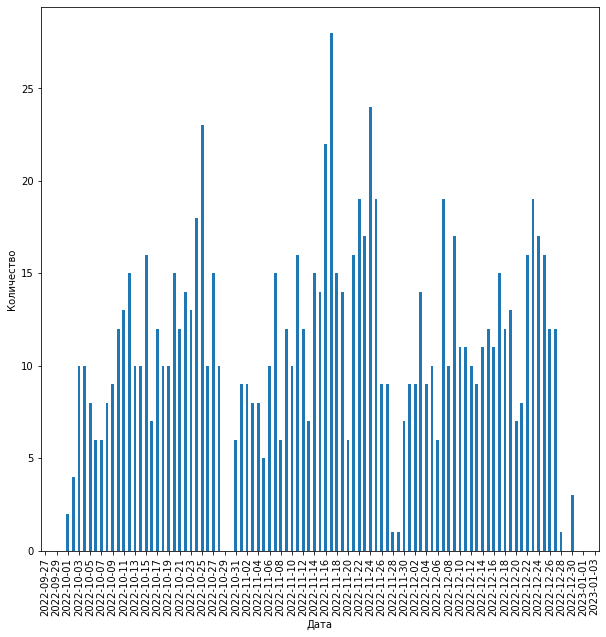

In [193]:
bar_plot(keys, vals, 'Дата', 'Количество', 90)

In [194]:
keys_cancel = keys
vals_cancel = vals

## Проблемы оплаты по дням совместно с числом заказов дошедших до статуса оплаты

In [195]:
pay_case_arr = np.array([])
pay_date_arr = np.array([])

for i in range(len(res_df)):
    if res_df['stage'][i] == 'Оплата':
        if (res_df['case'][i] not in pay_case_arr):
            pay_case_arr = np.append(pay_case_arr, [res_df['case'][i]])
            pay_date_arr = np.append(pay_date_arr, [res_df['start_time'][i].date()])

In [206]:
prob_pay_case_arr = np.array([])
prob_pay_date_arr = np.array([])

for i in range(len(res_df)):
    if res_df['stage'][i] == 'Оплата' and res_df['status'][i] == 'Error':
        if (res_df['case'][i] not in prob_pay_case_arr):
            prob_pay_case_arr = np.append(prob_pay_case_arr, [res_df['case'][i]])
            prob_pay_date_arr = np.append(prob_pay_date_arr, [res_df['start_time'][i].date()])

In [207]:
len(prob_pay_date_arr), prob_pay_date_arr

(2234,
 array([datetime.date(2022, 10, 5), datetime.date(2022, 10, 10),
        datetime.date(2022, 10, 17), ..., datetime.date(2022, 11, 16),
        datetime.date(2022, 12, 26), datetime.date(2022, 12, 8)],
       dtype=object))

In [197]:
temp_arr = np.sort(pay_date_arr)

counter = collections.Counter(temp_arr)

counter_sort = sorted(counter.items(), key=lambda pair: pair[0], reverse=False)
counter_sort

[(datetime.date(2022, 10, 1), 107),
 (datetime.date(2022, 10, 2), 131),
 (datetime.date(2022, 10, 3), 170),
 (datetime.date(2022, 10, 4), 185),
 (datetime.date(2022, 10, 5), 141),
 (datetime.date(2022, 10, 6), 140),
 (datetime.date(2022, 10, 7), 91),
 (datetime.date(2022, 10, 8), 153),
 (datetime.date(2022, 10, 9), 209),
 (datetime.date(2022, 10, 10), 200),
 (datetime.date(2022, 10, 11), 200),
 (datetime.date(2022, 10, 12), 224),
 (datetime.date(2022, 10, 13), 146),
 (datetime.date(2022, 10, 14), 189),
 (datetime.date(2022, 10, 15), 265),
 (datetime.date(2022, 10, 16), 247),
 (datetime.date(2022, 10, 17), 294),
 (datetime.date(2022, 10, 18), 250),
 (datetime.date(2022, 10, 19), 296),
 (datetime.date(2022, 10, 20), 228),
 (datetime.date(2022, 10, 21), 177),
 (datetime.date(2022, 10, 22), 257),
 (datetime.date(2022, 10, 23), 281),
 (datetime.date(2022, 10, 24), 268),
 (datetime.date(2022, 10, 25), 308),
 (datetime.date(2022, 10, 26), 260),
 (datetime.date(2022, 10, 27), 192),
 (datetime.

In [200]:
keys_all = np.array([])
vals_all = np.array([])

for i in range(len(counter_sort)):
    key, val = counter_sort[i]
    keys_all = np.append(keys_all, [key])
    vals_all = np.append(vals_all, [val])

In [209]:
temp_arr = np.sort(prob_pay_date_arr)

counter = collections.Counter(temp_arr)

counter_sort = sorted(counter.items(), key=lambda pair: pair[0], reverse=False)
counter_sort

[(datetime.date(2022, 10, 1), 10),
 (datetime.date(2022, 10, 2), 8),
 (datetime.date(2022, 10, 3), 25),
 (datetime.date(2022, 10, 4), 24),
 (datetime.date(2022, 10, 5), 18),
 (datetime.date(2022, 10, 6), 12),
 (datetime.date(2022, 10, 7), 12),
 (datetime.date(2022, 10, 8), 17),
 (datetime.date(2022, 10, 9), 20),
 (datetime.date(2022, 10, 10), 24),
 (datetime.date(2022, 10, 11), 27),
 (datetime.date(2022, 10, 12), 27),
 (datetime.date(2022, 10, 13), 20),
 (datetime.date(2022, 10, 14), 19),
 (datetime.date(2022, 10, 15), 33),
 (datetime.date(2022, 10, 16), 19),
 (datetime.date(2022, 10, 17), 29),
 (datetime.date(2022, 10, 18), 21),
 (datetime.date(2022, 10, 19), 30),
 (datetime.date(2022, 10, 20), 29),
 (datetime.date(2022, 10, 21), 20),
 (datetime.date(2022, 10, 22), 32),
 (datetime.date(2022, 10, 23), 34),
 (datetime.date(2022, 10, 24), 35),
 (datetime.date(2022, 10, 25), 38),
 (datetime.date(2022, 10, 26), 30),
 (datetime.date(2022, 10, 27), 31),
 (datetime.date(2022, 10, 28), 17),
 (

In [210]:
keys_prob = np.array([])
vals_prob = np.array([])

for i in range(len(counter_sort)):
    key, val = counter_sort[i]
    keys_prob = np.append(keys_prob, [key])
    vals_prob = np.append(vals_prob, [val])

In [212]:
df_all = pd.DataFrame()
df_all['Дата'] = keys_all
df_all['Количество'] = vals_all

df_cancel = pd.DataFrame()
df_cancel['Дата'] = keys_cancel
df_cancel['Количество'] = vals_cancel

df_prob = pd.DataFrame()
df_prob['Дата'] = keys_prob
df_prob['Количество'] = vals_prob

df_all, df_cancel, df_prob

(          Дата  Количество
 0   2022-10-01       107.0
 1   2022-10-02       131.0
 2   2022-10-03       170.0
 3   2022-10-04       185.0
 4   2022-10-05       141.0
 ..         ...         ...
 86  2022-12-27       207.0
 87  2022-12-28         4.0
 88  2022-12-29         3.0
 89  2022-12-30       116.0
 90  2022-12-31         8.0
 
 [91 rows x 2 columns],
           Дата  Количество
 0   2022-10-01         2.0
 1   2022-10-02         4.0
 2   2022-10-03        10.0
 3   2022-10-04        10.0
 4   2022-10-05         8.0
 ..         ...         ...
 83  2022-12-25        16.0
 84  2022-12-26        12.0
 85  2022-12-27        12.0
 86  2022-12-28         1.0
 87  2022-12-30         3.0
 
 [88 rows x 2 columns],
           Дата  Количество
 0   2022-10-01        10.0
 1   2022-10-02         8.0
 2   2022-10-03        25.0
 3   2022-10-04        24.0
 4   2022-10-05        18.0
 ..         ...         ...
 84  2022-12-26        31.0
 85  2022-12-27        22.0
 86  2022-12-28         

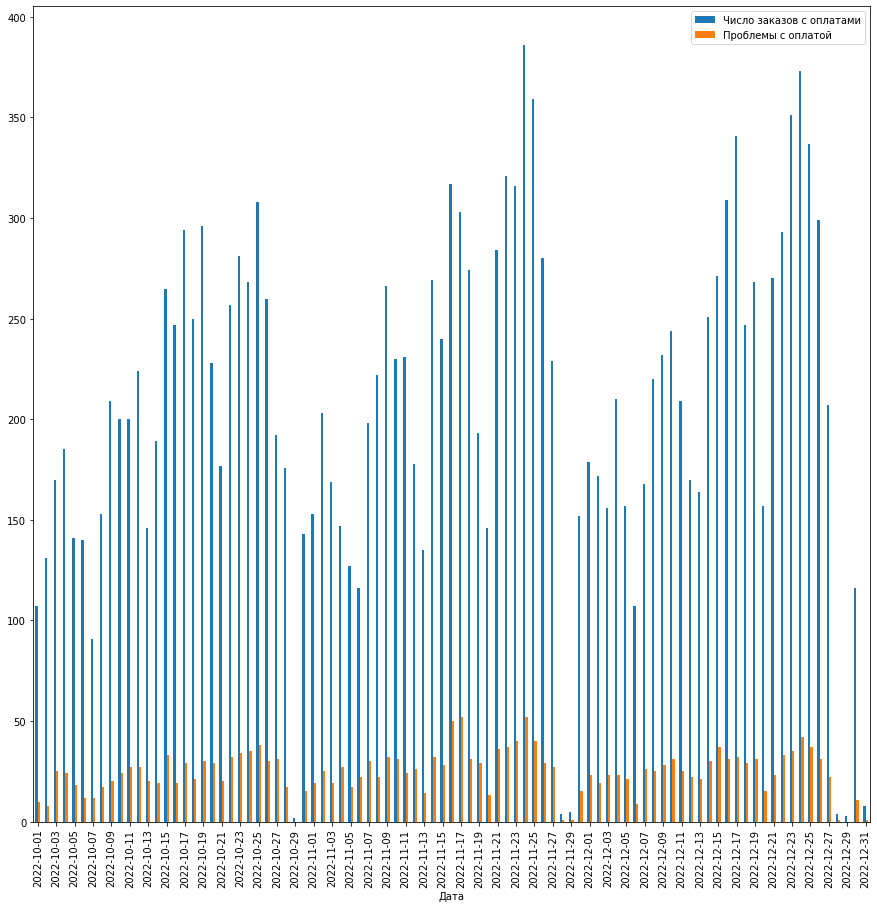

In [215]:

# Let's try merge and plot:

ax = df_all.merge(df_prob, on='Дата', how='outer').plot.bar(x='Дата', figsize=(15,15))
# other format with `ax`
ax.xaxis.set_major_locator(mdates.DayLocator(interval=2))
ax.legend(['Число заказов с оплатами', 'Проблемы с оплатой'])
ax.xaxis_date()



## Проблемы оплаты по дням совместно с числом заказов отмененных из-за проблем с оплатой

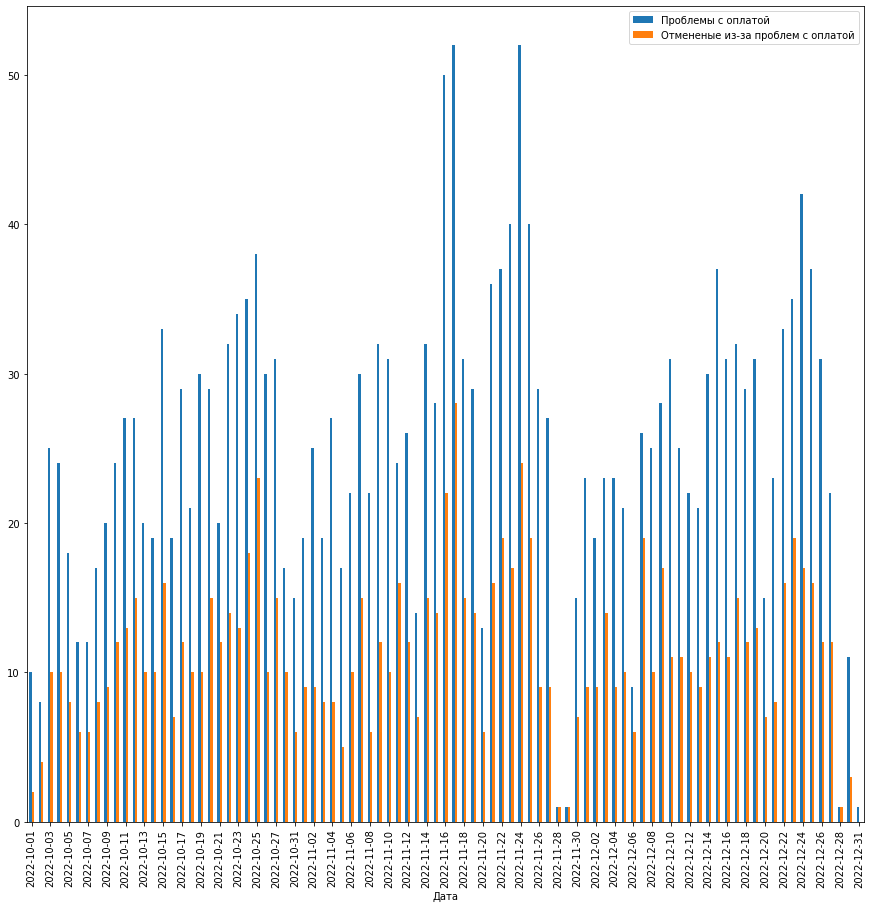

In [217]:
ax = df_prob.merge(df_cancel, on='Дата', how='outer').plot.bar(x='Дата', figsize=(15,15))
# other format with `ax`
ax.xaxis.set_major_locator(mdates.DayLocator(interval=2))
ax.legend(['Проблемы с оплатой', 'Отмененые из-за проблем с оплатой'])
ax.xaxis_date()

In [237]:
df1 = pd.DataFrame()
df2 = pd.DataFrame()

list_all  = df_all['Дата'].tolist()
list_prob = df_prob['Дата'].tolist()
list_cancel=df_cancel['Дата'].tolist()

for i in range(len(list_all)):
    if list_all[i] in list_prob:
        idx = list_prob.index(list_all[i])
        line1 = {'Дата': df_all['Дата'][i], 'Процент проблем': df_prob['Количество'][idx]/df_all['Количество'][i]}
        df1 = df1.append(line1, ignore_index=True)
    if list_all[i] in list_prob and list_all[i] in list_cancel:
        idx1 = list_prob.index(list_all[i])
        idx2 = list_cancel.index(list_all[i])
        line1 = {'Дата': df_all['Дата'][i], 'Процент отмен среди проблем': df_cancel['Количество'][idx2]/df_prob['Количество'][idx1]}
        df2 = df2.append(line1, ignore_index=True)
    

/tmp/ipykernel_26881/3112035140.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df1 = df1.append(line1, ignore_index=True)
/tmp/ipykernel_26881/3112035140.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(line1, ignore_index=True)
/tmp/ipykernel_26881/3112035140.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df1 = df1.append(line1, ignore_index=True)
/tmp/ipykernel_26881/3112035140.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append(line1, ignore_index=True)
/tmp/ipykernel_26881/3112035140.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fut

In [239]:
df1.to_excel('tables/Процент отмен среди проблем.xlsx')
df2.to_excel('tables/Процент проблем.xlsx')

# Баг системы


In [256]:
bag_case_arr = np.array([])
bag_date_arr = np.array([])

for i in range(len(res_df)):
    if res_df['stage'][i] == 'Заказ доставлен' and res_df['stage'][i-1] == 'Отмена заказа':
        if (res_df['case'][i] not in bag_case_arr):
            bag_case_arr = np.append(bag_case_arr, [res_df['case'][i]])
            bag_date_arr = np.append(bag_date_arr, [res_df['start_time'][i].date()])

In [257]:
bag_case_arr, len(bag_case_arr)

(array([2.72820846e+10, 3.17317021e+10, 3.24619390e+10, 3.31621546e+10,
        3.56589921e+10, 3.68970573e+10, 3.74667847e+10, 3.88425638e+10,
        4.25814987e+10, 4.46994044e+10, 4.50207570e+10, 4.59153854e+10,
        4.79776975e+10, 6.20653382e+10, 6.33437937e+10, 6.51417938e+10,
        6.53044475e+10, 6.59845257e+10, 6.97241276e+10, 7.04239832e+10,
        7.10244754e+10, 7.54293422e+10, 7.82449185e+10, 8.05835870e+10,
        8.63694051e+10]),
 25)

In [258]:
bag_case_df = pd.DataFrame()

for series in res_df.iloc:
    if series['case'] in bag_case_arr:
        bag_case_df = bag_case_df.append(series, ignore_index=True)

/tmp/ipykernel_26881/2875197356.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  bag_case_df = bag_case_df.append(series, ignore_index=True)


In [259]:
bag_case_df

,case,stage,start_time,end_time,client,staff,feedback,status
0,27282084576,Заказ оформлен,2022-12-01 14:49:05,2022-12-01 14:49:08,Елена Александровна Ковалева,NaN,,
1,27282084576,Поступление заказа сборщику,2022-12-01 14:50:19,2022-12-01 14:51:30,Елена Александровна Ковалева,Карпов Август Яковлевич,,
2,27282084576,Сборка заказа,2022-12-01 15:15:24,2022-12-01 15:39:17,Елена Александровна Ковалева,Карпов Август Яковлевич,,
3,27282084576,Упаковка товара,2022-12-01 15:41:16,2022-12-01 15:43:16,Елена Александровна Ковалева,Карпов Август Яковлевич,,
4,27282084576,Оплата,2022-12-01 15:43:41,2022-12-01 15:44:07,Елена Александровна Ковалева,Карпов Август Яковлевич,,Success
...,...,...,...,...,...,...,...,...
257,86369405113,Передача товара курьеру,2022-12-02 09:00:01,2022-12-02 09:03:54,Елена Александровна Ковалева,Кондрат Григорьевич Ковалев,,
258,86369405113,Доставка заказа,2022-12-02 09:03:54,2022-12-02 09:36:53,Елена Александровна Ковалева,Кондрат Григорьевич Ковалев,,
259,86369405113,Проверка заказа,2022-12-02 09:36:53,2022-12-02 09:38:32,Елена Александровна Ковалева,Кондрат Григорьевич Ковалев,0,
260,86369405113,Отмена заказа,2022-12-02 09:38:32,2022-12-02 09:38:51,Елена Александровна Ковалева,Кондрат Григорьевич Ковалев,,


In [260]:
bag_case_df.to_excel('tables/bag_cases.xlsx')

In [261]:
temp_arr = np.sort(bag_date_arr)

counter = collections.Counter(temp_arr)

counter_sort = sorted(counter.items(), key=lambda pair: pair[0], reverse=False)
counter_sort

[(datetime.date(2022, 12, 1), 3),
 (datetime.date(2022, 12, 2), 3),
 (datetime.date(2022, 12, 3), 4),
 (datetime.date(2022, 12, 4), 3),
 (datetime.date(2022, 12, 5), 3),
 (datetime.date(2022, 12, 6), 1),
 (datetime.date(2022, 12, 7), 2),
 (datetime.date(2022, 12, 8), 2),
 (datetime.date(2022, 12, 9), 4)]

In [262]:
keys_bug = np.array([])
vals_bug = np.array([])

for i in range(len(counter_sort)):
    key, val = counter_sort[i]
    keys_bug = np.append(keys_bug, [key])
    vals_bug = np.append(vals_bug, [val])

Text(0, 0.5, 'Количество')

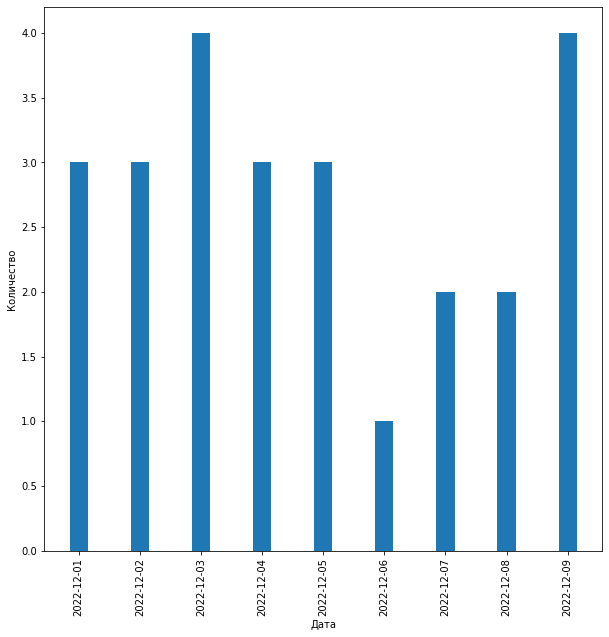

In [263]:
fig,ax = plt.subplots(figsize= (10,10))
ax.bar(keys_bug, vals_bug, width=0.3)
plt.xticks(rotation=90)
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.xlabel('Дата')
plt.ylabel('Количество')

# Перенос даты

In [4]:
res_dur_df = res_df.copy()
dur_arr = np.array([])

for series in res_dur_df.iloc:
    dur_arr = np.append(dur_arr, [(series['end_time'] - series['start_time']).total_seconds()])

In [5]:
dur_arr

array([   7.,   67., 1422., ...,   99.,   19.,    6.])

In [6]:
res_dur_df['duration'] = dur_arr
res_dur_df

,case,stage,start_time,end_time,client,staff,feedback,status,duration
0,77654086061,Заказ оформлен,2022-10-05 17:57:33,2022-10-05 17:57:40,Ефим Елисеевич Кошелев,NaN,,,7.0
1,77654086061,Поступление заказа сборщику,2022-10-05 17:57:40,2022-10-05 17:58:47,Ефим Елисеевич Кошелев,Варлаам Матвеевич Орехов,,,67.0
2,77654086061,Сборка заказа,2022-10-05 17:58:47,2022-10-05 18:22:29,Ефим Елисеевич Кошелев,Варлаам Матвеевич Орехов,,,1422.0
3,77654086061,Упаковка товара,2022-10-05 18:22:29,2022-10-05 18:24:31,Ефим Елисеевич Кошелев,Варлаам Матвеевич Орехов,,,122.0
4,77654086061,Оплата,2022-10-05 18:24:31,2022-10-05 18:24:54,Ефим Елисеевич Кошелев,Варлаам Матвеевич Орехов,,Error,23.0
...,...,...,...,...,...,...,...,...,...
179025,86369405113,Передача товара курьеру,2022-12-02 09:00:01,2022-12-02 09:03:54,Елена Александровна Ковалева,Кондрат Григорьевич Ковалев,,,233.0
179026,86369405113,Доставка заказа,2022-12-02 09:03:54,2022-12-02 09:36:53,Елена Александровна Ковалева,Кондрат Григорьевич Ковалев,,,1979.0
179027,86369405113,Проверка заказа,2022-12-02 09:36:53,2022-12-02 09:38:32,Елена Александровна Ковалева,Кондрат Григорьевич Ковалев,0,,99.0
179028,86369405113,Отмена заказа,2022-12-02 09:38:32,2022-12-02 09:38:51,Елена Александровна Ковалева,Кондрат Григорьевич Ковалев,,,19.0


In [7]:
res_dur_df['duration'] = res_dur_df['duration'] / 60

case_df_dict = {}

for series in res_dur_df.iloc:
    if series['case'] in case_df_dict.keys():
        case_df_dict[series['case']] = case_df_dict[series['case']].append(series, ignore_index=True)
    else:
        case_df_dict[series['case']] = pd.DataFrame()
        case_df_dict[series['case']] = case_df_dict[series['case']].append(series, ignore_index=True)

/tmp/ipykernel_25290/2585820358.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  case_df_dict[series['case']] = case_df_dict[series['case']].append(series, ignore_index=True)
/tmp/ipykernel_25290/2585820358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  case_df_dict[series['case']] = case_df_dict[series['case']].append(series, ignore_index=True)
/tmp/ipykernel_25290/2585820358.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  case_df_dict[series['case']] = case_df_dict[series['case']].append(series, ignore_index=True)
/tmp/ipykernel_25290/2585820358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  case_df_dict[series['cas

In [35]:
long_time_df = pd.DataFrame()

for keys, vals in case_df_dict.items():
    for i in range(len(vals)):
        if i != 0:
            if vals['start_time'][i].hour > 8 and (vals['end_time'][i-1].hour < 8 or (vals['end_time'][i-1].date() != vals['start_time'][i].date())):
                if vals['stage'][i-1] != 'Заказ оформлен':
                    long_time_df = long_time_df.append(vals.iloc[i-1])
                    long_time_df = long_time_df.append(vals.iloc[i])

/tmp/ipykernel_29666/755162530.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  long_time_df = long_time_df.append(vals.iloc[i-1])
/tmp/ipykernel_29666/755162530.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  long_time_df = long_time_df.append(vals.iloc[i])
/tmp/ipykernel_29666/755162530.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  long_time_df = long_time_df.append(vals.iloc[i-1])
/tmp/ipykernel_29666/755162530.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  long_time_df = long_time_df.append(vals.iloc[i])
/tmp/ipykernel_29666/755162530.py:8: FutureWarning: The frame.append method is deprecated and will be removed fr

In [36]:
long_time_df, len(long_time_df)

(          case                    stage          start_time  \
 4  44699404389            Сборка заказа 2022-12-02 23:37:13   
 5  44699404389          Упаковка товара 2022-12-03 09:00:00   
 2  45020756974            Сборка заказа 2022-12-03 23:43:40   
 3  45020756974          Упаковка товара 2022-12-04 09:00:01   
 4  86369405113                   Оплата 2022-12-01 23:56:59   
 5  86369405113  Передача товара курьеру 2022-12-02 09:00:01   
 
              end_time                        client  \
 4 2022-12-03 00:01:14       Алена Вадимовна Евсеева   
 5 2022-12-03 09:01:39       Алена Вадимовна Евсеева   
 2 2022-12-04 00:07:25  Елена Александровна Ковалева   
 3 2022-12-04 09:02:04  Елена Александровна Ковалева   
 4 2022-12-01 23:57:24  Елена Александровна Ковалева   
 5 2022-12-02 09:03:54  Елена Александровна Ковалева   
 
                             staff feedback   status   duration  
 4  Лаврентьев Остромир Витальевич                    24.016667  
 5  Лаврентьев Остромир 

In [37]:
long_time_df.to_excel('tables/long_time.xlsx')

In [80]:
date_df_dict = {}

for series in res_dur_df.iloc:
    if series['start_time'].date() in date_df_dict.keys():
        date_df_dict[series['start_time'].date()] = date_df_dict[series['start_time'].date()].append(series, ignore_index=True)
    else:
        date_df_dict[series['start_time'].date()] = pd.DataFrame()
        date_df_dict[series['start_time'].date()] = date_df_dict[series['start_time'].date()].append(series, ignore_index=True)

/tmp/ipykernel_24773/1254626748.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  date_df_dict[series['start_time'].date()] = date_df_dict[series['start_time'].date()].append(series, ignore_index=True)
/tmp/ipykernel_24773/1254626748.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  date_df_dict[series['start_time'].date()] = date_df_dict[series['start_time'].date()].append(series, ignore_index=True)
/tmp/ipykernel_24773/1254626748.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  date_df_dict[series['start_time'].date()] = date_df_dict[series['start_time'].date()].append(series, ignore_index=True)
/tmp/ipykernel_24773/1254626748.py:5: FutureWarning: The frame.append method is deprecated and will be removed from panda

In [81]:
date_df_dict

{datetime.date(2022, 10, 5):              case                        stage          start_time  \
 0     77654086061               Заказ оформлен 2022-10-05 17:57:33   
 1     77654086061  Поступление заказа сборщику 2022-10-05 17:57:40   
 2     77654086061                Сборка заказа 2022-10-05 17:58:47   
 3     77654086061              Упаковка товара 2022-10-05 18:22:29   
 4     77654086061                       Оплата 2022-10-05 18:24:31   
 ...           ...                          ...                 ...   
 1372  12574564931                Отмена заказа 2022-10-05 16:17:31   
 1373  48708036786               Заказ оформлен 2022-10-05 16:17:37   
 1374  48708036786                Отмена заказа 2022-10-05 16:17:42   
 1375  23481354948               Заказ оформлен 2022-10-05 10:01:56   
 1376  23481354948                Отмена заказа 2022-10-05 10:02:00   
 
                 end_time                         client  \
 0    2022-10-05 17:57:40         Ефим Елисеевич Кошелев  

In [87]:
start_time_df_dict = {}) # date, start work time, first order time


for key, val in date_df_dict.items():
    print(key)
    for series in val.iloc:
        if series['case'] != 'Заказ оформлен' and series['start_time'].hour > 7:
            if series['start_time'].date() in start_time_df_dict['Дата']:
                print('StopAsyncIteration')
                print(start_time_df_dict.index[start_time_df_dict['Дата']==series['start_time'].date()].tolist())
            else:
                line = {'Дата': series['start_time'].date(), 'start_work_time': series['start_time'].time(), 'first_order_time': None}
                start_time_df_dict = start_time_df_dict.append(line, ignore_index=True)

        #         if start_time_df_dict[series['start_time'].date()] > series['start_time'].time():
        #             start_time_df_dict[series['start_time'].date()] = series['start_time'].time()
        #     else:
        #         start_time_df_dict[series['start_time'].date()] = series['start_time'].time()
        # if series['case'] == 'Заказ оформлен':
        #     if series['start_time'].date() in start_time_df_dict['Дата']:
        #         if start_time_df_dict[series['start_time'].date()] > series['start_time'].time():
        #             start_time_df_dict[series['start_time'].date()] = series['start_time'].time()
        #     else:
        #         start_time_df_dict[series['start_time'].date()] = series['start_time'].time()
    break

2022-10-05


/tmp/ipykernel_24773/2108280938.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  start_time_df_dict = start_time_df_dict.append(line, ignore_index=True)
/tmp/ipykernel_24773/2108280938.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  start_time_df_dict = start_time_df_dict.append(line, ignore_index=True)
/tmp/ipykernel_24773/2108280938.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  start_time_df_dict = start_time_df_dict.append(line, ignore_index=True)
/tmp/ipykernel_24773/2108280938.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  start_time_df_dict = start_time_df_dict.append(line, ignore_index=True)
/tmp/ipykernel_2

In [86]:
start_time_df_dict

,Дата,start_work_time,first_order_time
0,2022-10-05,17:57:33,None
1,2022-10-05,17:57:40,None
2,2022-10-05,17:58:47,None
3,2022-10-05,18:22:29,None
4,2022-10-05,18:24:31,None
...,...,...,...
1311,2022-10-05,16:17:31,None
1312,2022-10-05,16:17:37,None
1313,2022-10-05,16:17:42,None
1314,2022-10-05,10:01:56,None


TypeError: float() argument must be a string or a real number, not 'datetime.time'

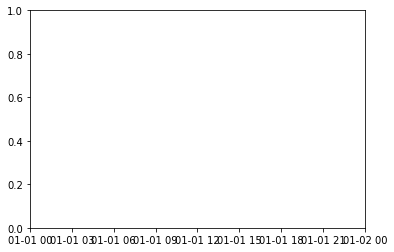

In [46]:
keys_time = list(start_time_df_dict.keys())
vals_time = list(start_time_df_dict.values())

ax = plt.subplot()
ax.plot(keys_time, vals_time)
ax.yaxis.set_major_locator(HourLocator())
ax.yaxis.set_major_formatter(DateFormatter('%H:%M'))

In [48]:
sorted_start_time = dict(sorted(start_time_df_dict.items()))
sorted_start_time

{datetime.date(2022, 10, 1): datetime.time(8, 1, 21),
 datetime.date(2022, 10, 2): datetime.time(8, 5, 4),
 datetime.date(2022, 10, 3): datetime.time(8, 9, 59),
 datetime.date(2022, 10, 4): datetime.time(8, 2, 35),
 datetime.date(2022, 10, 5): datetime.time(8, 4, 12),
 datetime.date(2022, 10, 6): datetime.time(8, 4, 37),
 datetime.date(2022, 10, 7): datetime.time(8, 7, 30),
 datetime.date(2022, 10, 8): datetime.time(8, 1, 12),
 datetime.date(2022, 10, 9): datetime.time(8, 7, 1),
 datetime.date(2022, 10, 10): datetime.time(8, 3, 35),
 datetime.date(2022, 10, 11): datetime.time(8, 13, 28),
 datetime.date(2022, 10, 12): datetime.time(8, 5, 37),
 datetime.date(2022, 10, 13): datetime.time(8, 0, 5),
 datetime.date(2022, 10, 14): datetime.time(8, 10, 39),
 datetime.date(2022, 10, 15): datetime.time(8, 11, 14),
 datetime.date(2022, 10, 16): datetime.time(8, 33, 25),
 datetime.date(2022, 10, 17): datetime.time(8, 8, 42),
 datetime.date(2022, 10, 18): datetime.time(8, 4, 53),
 datetime.date(202

In [54]:
start_time_df = pd.DataFrame(sorted_start_time.items(), columns=['Дата', 'Начало работы'])

In [55]:
start_time_df

,Дата,Начало работы
0,2022-10-01,08:01:21
1,2022-10-02,08:05:04
2,2022-10-03,08:09:59
3,2022-10-04,08:02:35
4,2022-10-05,08:04:12
...,...,...
82,2022-12-25,08:02:37
83,2022-12-26,08:01:08
84,2022-12-27,08:08:32
85,2022-12-29,22:59:40


In [56]:
start_time_df.to_excel('tables/start_time.xlsx')

# Проблема передачи заказов курьерам

In [9]:
del_cancel_df = pd.DataFrame()

for key, dataf in case_df_dict.items():
    np_stage = dataf['stage'].to_numpy()
    if 'Оплата' == np_stage[-2] and 'Отмена заказа' == np_stage[-1]:
        pass
    elif 'Сборка заказа' in np_stage:
        start_time_i = np.where(np_stage=='Сборка заказа')[0][-1]
        start_time = dataf['end_time'][start_time_i]

        staff = np.array([])
        if 'Поступление заказа сборщику' in np_stage:
            staff_i = np.where(np_stage == 'Поступление заказа сборщику')[0][0]
            staff = np.append(staff, 'Сборщик ' + dataf['staff'][staff_i])
        
        end_time_i = 0
        if 'Передача товара курьеру' in np_stage:
            end_time_i = np.where(np_stage=='Передача товара курьеру')[0][0]
            staff = np.append(staff, 'Курьер ' + dataf['staff'][end_time_i])
        else:
            end_time_i = len(np_stage) - 1
        end_time   = dataf['end_time'][end_time_i]

        duration   = int((end_time - start_time).total_seconds() / 60)
        str_time = 0
        if duration > 30:
            str_time = 1 # 'Too big time'
        else:
            str_time = 0 # "It is okay"

        order_cancel = 0
        if 'Отмена заказа' in np_stage:
            order_cancel = 1 # canceled
        else:
            order_cancel = 0 # not canceled
        
        line_dict = {'case': [key], 'start_time': [start_time], 'end_time': [end_time], 'duration': [duration], 'Time waited': str_time, 'Canceled': order_cancel, 'staff': [staff]}
        line_df = pd.DataFrame(line_dict)
        # print(line_df)
        del_cancel_df= del_cancel_df.append(line_df)

/tmp/ipykernel_22805/2421897224.py:40: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  del_cancel_df= del_cancel_df.append(line_df)
/tmp/ipykernel_22805/2421897224.py:40: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  del_cancel_df= del_cancel_df.append(line_df)
/tmp/ipykernel_22805/2421897224.py:40: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  del_cancel_df= del_cancel_df.append(line_df)
/tmp/ipykernel_22805/2421897224.py:40: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  del_cancel_df= del_cancel_df.append(line_df)
/tmp/ipykernel_22805/2421897224.py:40: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

In [10]:
del_cancel_df

,case,start_time,end_time,duration,Time waited,Canceled,staff
0,77917019597,2022-12-11 13:35:47,2022-12-11 13:42:58,7,0,1,"[Сборщик Демид Анисимович Суворов, Курьер Арка..."
0,36725590268,2022-10-24 21:01:12,2022-10-24 21:08:46,7,0,1,"[Сборщик Ольга Юльевна Филатова, Курьер Абрамя..."
0,21466524103,2022-10-11 13:18:10,2022-10-11 13:24:34,6,0,1,"[Сборщик Моисеев Ипполит Исидорович, Курьер Ав..."
0,51912812408,2022-10-14 22:17:02,2022-10-14 22:24:54,7,0,1,"[Сборщик Нинель Антоновна Кудряшова, Курьер Ад..."
0,11277395029,2022-10-08 23:18:36,2022-10-08 23:26:34,7,0,1,"[Сборщик Брагина Елена Кузьминична, Курьер Ада..."
...,...,...,...,...,...,...,...
0,71024475446,2022-12-09 19:51:52,2022-12-09 20:04:37,12,0,1,"[Сборщик Ильина Майя Станиславовна, Курьер Све..."
0,75429342160,2022-12-08 12:55:52,2022-12-08 13:11:24,15,0,1,"[Сборщик Быкова Анжелика Анатольевна, Курьер С..."
0,78244918485,2022-12-06 23:17:02,2022-12-06 23:30:23,13,0,1,"[Сборщик Быкова Анжелика Анатольевна, Курьер С..."
0,80583587050,2022-12-03 11:53:34,2022-12-03 12:08:57,15,0,1,"[Сборщик Красильникова Нонна Макаровна, Курьер..."


In [11]:
del_cancel_df['Time waited'][0]

0    0
0    0
0    0
0    0
0    0
    ..
0    0
0    0
0    0
0    0
0    1
Name: Time waited, Length: 18775, dtype: int64

In [12]:
collector_dict = {}
courier_dict = {}

collector_all_dict = {}
courier_all_dict = {}

for series in del_cancel_df.iloc:
    if len(series['staff']) == 2:
        if series['staff'][0] in collector_all_dict.keys():
            collector_all_dict[series['staff'][0]] = collector_all_dict[series['staff'][0]] + 1
        else:
            collector_all_dict[series['staff'][0]] = 1
        
        if series['staff'][1] in courier_all_dict.keys():
            courier_all_dict[series['staff'][1]] = courier_all_dict[series['staff'][1]] + 1
        else:
            courier_all_dict[series['staff'][1]] = 1
    elif len(series['staff']) == 1:
        if 'Сборщик' in series['staff'][0]:
            if series['staff'][0] in collector_all_dict.keys():
                collector_all_dict[series['staff'][0]] = collector_all_dict[series['staff'][0]] + 1
            else:
                collector_all_dict[series['staff'][0]] = 1
            
        elif 'Курьер' in series['staff'][0]:
            if series['staff'][0] in courier_all_dict.keys():
                courier_all_dict[series['staff'][0]] = courier_all_dict[series['staff'][0]] + 1
            else:
                courier_all_dict[series['staff'][0]] = 1
                
    if series['Time waited'] == 1:
        if len(series['staff']) == 2:
            if series['staff'][0] in collector_dict.keys():
                collector_dict[series['staff'][0]] = collector_dict[series['staff'][0]] + 1
            else:
                collector_dict[series['staff'][0]] = 1
            
            if series['staff'][1] in courier_dict.keys():
                courier_dict[series['staff'][1]] = courier_dict[series['staff'][1]] + 1
            else:
                courier_dict[series['staff'][1]] = 1
        elif len(series['staff']) == 1:
            if 'Сборщик' in series['staff'][0]:
                if series['staff'][0] in collector_dict.keys():
                    collector_dict[series['staff'][0]] = collector_dict[series['staff'][0]] + 1
                else:
                    collector_dict[series['staff'][0]] = 1
                
            elif 'Курьер' in series['staff'][0]:
                if series['staff'][0] in courier_dict.keys():
                    courier_dict[series['staff'][0]] = courier_dict[series['staff'][0]] + 1
                else:
                    courier_dict[series['staff'][0]] = 1

In [13]:
collector_dict, courier_dict

({'Сборщик Буров Руслан Матвеевич': 18,
  'Сборщик Макаров Измаил Брониславович': 35,
  'Сборщик Оксана Архиповна Одинцова': 27,
  'Сборщик Харитонов Сильвестр Марсович': 20,
  'Сборщик Карпов Август Яковлевич': 27,
  'Сборщик Красильникова Нонна Макаровна': 27,
  'Сборщик Миронов Эрнст Давидович': 11,
  'Сборщик Эмилия Константиновна Суворова': 26,
  'Сборщик Пахомова Алевтина Даниловна': 26,
  'Сборщик Ермил Зиновьевич Давыдов': 29,
  'Сборщик Игнатова Марфа Архиповна': 31,
  'Сборщик Ольга Юльевна Филатова': 23,
  'Сборщик Осипов Софон Ефстафьевич': 26,
  'Сборщик Самсон Харлампович Зимин': 26,
  'Сборщик Соколов Василий Захарьевич': 11,
  'Сборщик Сазонова Валентина Святославовна': 20,
  'Сборщик Матвеева Алла Леонидовна': 18,
  'Сборщик Пелагея Юльевна Беляева': 8,
  'Сборщик Кулагин Валерий Фомич': 14,
  'Сборщик Зыков Аполлинарий Валерьевич': 12,
  'Сборщик Титов Вячеслав Анатольевич': 10,
  'Сборщик София Алексеевна Назарова': 21,
  'Сборщик Фомин Мир Трифонович': 11,
  'Сборщи

In [14]:
courier_all_dict, collector_all_dict

({'Курьер Аркадин Иван Иванович': 96,
  'Курьер Абрамян Хорен Бабкенович': 144,
  'Курьер Аврамов Иван Иванович': 155,
  'Курьер Адашев Раджаб Халимович': 151,
  'Курьер Байжанбаев Жанат Ануарбекович': 95,
  'Курьер Бакиров Филарит Абдулгазимович': 95,
  'Курьер Анкудинов Андрей Робертович': 146,
  'Курьер Алексеев Николай Валентинович': 149,
  'Курьер Абдульманов Рим Салимьянович': 146,
  'Курьер Багов Грегори-Саид Муратович': 99,
  'Курьер Байковский Ефим Ицкович': 98,
  'Курьер Абжалилов Халил Галеевич': 156,
  'Курьер Авилов Виктор Васильевич': 159,
  'Курьер Аслан Сиявуш': 98,
  'Курьер Аникеев Серафим Михайлович': 144,
  'Курьер Апсолон Андрей Николаевич': 93,
  'Курьер Абашидзе Давид Иванович': 152,
  'Курьер Агзамов Юлдаш': 148,
  'Курьер Азаров Борис Иванович': 154,
  'Курьер Алиева Татьяна Зарфалиевна': 151,
  'Курьер Антоник Владимир Владимирович': 144,
  'Курьер Алекперов Шахмар Зульфугар оглы': 147,
  'Курьер Акимов Виктор Акимович': 145,
  'Курьер Алексеев Борис Алексееви

In [15]:
courier_df_dict = {'Курьер': courier_dict.keys(), 'Количество нарушений': courier_dict.values()}
collector_df_dict = {'Сборщик' : collector_dict.keys(), 'Количество нарушений': collector_dict.values()}
courier_all_df_dict = {'Курьер': courier_all_dict.keys(), 'Количество доставок': courier_all_dict.values()}
collector_all_df_dict = {'Сборщик' : collector_all_dict.keys(), 'Количество доставок': collector_all_dict.values()}

In [16]:
courier_df = pd.DataFrame(courier_df_dict)
collector_df = pd.DataFrame(collector_df_dict)
courier_all_df = pd.DataFrame(courier_all_df_dict)
collector_all_df = pd.DataFrame(collector_all_df_dict)

In [17]:
courier_df = courier_df.sort_values(by='Количество нарушений')
collector_df = collector_df.sort_values(by='Количество нарушений')
courier_all_df = courier_all_df.sort_values(by='Количество доставок')
collector_all_df = collector_all_df.sort_values(by='Количество доставок')

In [18]:
courier_all_df

,Курьер,Количество доставок
138,Курьер Светлана Вадимовна Евсеева,9
137,Курьер Кондрат Григорьевич Ковалев,16
133,Курьер Ахметвалиев Линар Минигаянович,92
119,Курьер Арзуманян Ерванд Ашотович,92
15,Курьер Апсолон Андрей Николаевич,93
...,...,...
12,Курьер Авилов Виктор Васильевич,159
34,Курьер Авдюшко Виктор Антонович,160
65,Курьер Абдулов Александр Гавриилович,160
30,Курьер Ага-Мирзаев Мухтар Кардашханович,160


In [19]:
courier_df

,Курьер,Количество нарушений
137,Курьер Светлана Вадимовна Евсеева,1
138,Курьер Кондрат Григорьевич Ковалев,2
122,Курьер Аловов Ата,2
123,Курьер Астахов Валерий Анатольевич,3
125,Курьер Ахвледиани Эрлом Сергеевич,3
...,...,...
59,Курьер Агаев Октай Бахрам оглы,17
41,Курьер Айзикович Марк Львович,17
90,Курьер Альтус Ефим Григорьевич,18
45,Курьер Алексеев Николай Валентинович,19


In [20]:
courier_df.to_excel('tables/courier_errors.xlsx')
collector_df.to_excel('tables/collector_errors.xlsx')

In [21]:
percent_arr = np.array([])
courier_arr = courier_df['Курьер'].to_numpy()
courier_err_num_arr = courier_df['Количество нарушений'].to_numpy()

for series in courier_all_df.iloc:
    if series['Курьер'] in courier_arr:
        i = np.where(courier_arr == series['Курьер'])[0][0]
        percent_arr = np.append(percent_arr, [courier_err_num_arr[i]/series['Количество доставок']])

courier_all_df['Процент нарушений'] = percent_arr

In [22]:
percent_arr = np.array([])
collector_arr = collector_df['Сборщик'].to_numpy()
collector_err_num_arr = collector_df['Количество нарушений'].to_numpy()

for series in collector_all_df.iloc:
    if series['Сборщик'] in collector_arr:
        i = np.where(collector_arr == series['Сборщик'])[0][0]
        percent_arr = np.append(percent_arr, [collector_err_num_arr[i]/series['Количество доставок']])

collector_all_df['Процент нарушений'] = percent_arr

In [23]:
collector_all_df

,Сборщик,Количество доставок,Процент нарушений
62,Сборщик Пелагея Юльевна Беляева,193,0.041451
32,Сборщик Зиновий Тимурович Евдокимов,193,0.046632
33,Сборщик Полина Игоревна Вишнякова,196,0.071429
63,Сборщик Фомин Мир Трифонович,196,0.056122
52,Сборщик Мария Леоновна Попова,198,0.055556
...,...,...,...
23,Сборщик Макаров Измаил Брониславович,372,0.094086
11,Сборщик Абсалямов Мифтах Шагеевич,373,0.053619
51,Сборщик Самсон Харлампович Зимин,373,0.069705
24,Сборщик Горбачева Екатерина Натановна,376,0.074468


In [24]:

courier_all_df = courier_all_df.sort_values(by='Процент нарушений')
collector_all_df = collector_all_df.sort_values(by='Процент нарушений')

In [25]:
courier_all_df.to_excel('tables/courier_all.xlsx')
collector_all_df.to_excel('tables/collector_all.xlsx')

## Гистограмма по дням нарушений

In [37]:
sla_err_date_arr = np.array([])
build_all_date_arr = np.array([])

for series in del_cancel_df.iloc:
    build_all_date_arr = np.append(build_all_date_arr, [series['start_time'].date()])
    if series['Time waited'] == 1:
        sla_err_date_arr = np.append(sla_err_date_arr, [series['start_time'].date()])

In [38]:
sla_err_date_arr, len(sla_err_date_arr)

(array([datetime.date(2022, 11, 10), datetime.date(2022, 11, 1),
        datetime.date(2022, 10, 26), ..., datetime.date(2022, 12, 3),
        datetime.date(2022, 12, 4), datetime.date(2022, 12, 1)],
       dtype=object),
 1256)

In [39]:
build_all_date_arr, len(build_all_date_arr)

(array([datetime.date(2022, 12, 11), datetime.date(2022, 10, 24),
        datetime.date(2022, 10, 11), ..., datetime.date(2022, 12, 6),
        datetime.date(2022, 12, 3), datetime.date(2022, 12, 1)],
       dtype=object),
 18775)

In [40]:
temp_arr = np.sort(sla_err_date_arr)

counter = collections.Counter(temp_arr)

counter_sort = sorted(counter.items(), key=lambda pair: pair[0], reverse=False)
counter_sort

[(datetime.date(2022, 10, 1), 8),
 (datetime.date(2022, 10, 2), 8),
 (datetime.date(2022, 10, 3), 12),
 (datetime.date(2022, 10, 4), 11),
 (datetime.date(2022, 10, 5), 14),
 (datetime.date(2022, 10, 6), 10),
 (datetime.date(2022, 10, 7), 6),
 (datetime.date(2022, 10, 8), 9),
 (datetime.date(2022, 10, 9), 14),
 (datetime.date(2022, 10, 10), 14),
 (datetime.date(2022, 10, 11), 14),
 (datetime.date(2022, 10, 12), 15),
 (datetime.date(2022, 10, 13), 19),
 (datetime.date(2022, 10, 14), 11),
 (datetime.date(2022, 10, 15), 17),
 (datetime.date(2022, 10, 16), 17),
 (datetime.date(2022, 10, 17), 16),
 (datetime.date(2022, 10, 18), 18),
 (datetime.date(2022, 10, 19), 17),
 (datetime.date(2022, 10, 20), 14),
 (datetime.date(2022, 10, 21), 9),
 (datetime.date(2022, 10, 22), 20),
 (datetime.date(2022, 10, 23), 19),
 (datetime.date(2022, 10, 24), 23),
 (datetime.date(2022, 10, 25), 23),
 (datetime.date(2022, 10, 26), 18),
 (datetime.date(2022, 10, 27), 13),
 (datetime.date(2022, 10, 28), 13),
 (date

In [41]:
keys_err_sla = np.array([])
vals_err_sla = np.array([])

for i in range(len(counter_sort)):
    key, val = counter_sort[i]
    keys_err_sla = np.append(keys_err_sla, [key])
    vals_err_sla = np.append(vals_err_sla, [val])

In [42]:
keys_err_sla, vals_err_sla

(array([datetime.date(2022, 10, 1), datetime.date(2022, 10, 2),
        datetime.date(2022, 10, 3), datetime.date(2022, 10, 4),
        datetime.date(2022, 10, 5), datetime.date(2022, 10, 6),
        datetime.date(2022, 10, 7), datetime.date(2022, 10, 8),
        datetime.date(2022, 10, 9), datetime.date(2022, 10, 10),
        datetime.date(2022, 10, 11), datetime.date(2022, 10, 12),
        datetime.date(2022, 10, 13), datetime.date(2022, 10, 14),
        datetime.date(2022, 10, 15), datetime.date(2022, 10, 16),
        datetime.date(2022, 10, 17), datetime.date(2022, 10, 18),
        datetime.date(2022, 10, 19), datetime.date(2022, 10, 20),
        datetime.date(2022, 10, 21), datetime.date(2022, 10, 22),
        datetime.date(2022, 10, 23), datetime.date(2022, 10, 24),
        datetime.date(2022, 10, 25), datetime.date(2022, 10, 26),
        datetime.date(2022, 10, 27), datetime.date(2022, 10, 28),
        datetime.date(2022, 10, 29), datetime.date(2022, 10, 31),
        datetime.da

In [43]:
temp_arr = np.sort(build_all_date_arr)

counter = collections.Counter(temp_arr)

counter_sort = sorted(counter.items(), key=lambda pair: pair[0], reverse=False)
counter_sort

[(datetime.date(2022, 10, 1), 114),
 (datetime.date(2022, 10, 2), 135),
 (datetime.date(2022, 10, 3), 167),
 (datetime.date(2022, 10, 4), 188),
 (datetime.date(2022, 10, 5), 143),
 (datetime.date(2022, 10, 6), 142),
 (datetime.date(2022, 10, 7), 88),
 (datetime.date(2022, 10, 8), 152),
 (datetime.date(2022, 10, 9), 209),
 (datetime.date(2022, 10, 10), 190),
 (datetime.date(2022, 10, 11), 193),
 (datetime.date(2022, 10, 12), 220),
 (datetime.date(2022, 10, 13), 138),
 (datetime.date(2022, 10, 14), 186),
 (datetime.date(2022, 10, 15), 263),
 (datetime.date(2022, 10, 16), 252),
 (datetime.date(2022, 10, 17), 298),
 (datetime.date(2022, 10, 18), 254),
 (datetime.date(2022, 10, 19), 295),
 (datetime.date(2022, 10, 20), 218),
 (datetime.date(2022, 10, 21), 175),
 (datetime.date(2022, 10, 22), 251),
 (datetime.date(2022, 10, 23), 285),
 (datetime.date(2022, 10, 24), 270),
 (datetime.date(2022, 10, 25), 312),
 (datetime.date(2022, 10, 26), 263),
 (datetime.date(2022, 10, 27), 187),
 (datetime.

In [44]:
keys_all_build = np.array([])
vals_all_build = np.array([])

for i in range(len(counter_sort)):
    key, val = counter_sort[i]
    keys_all_build = np.append(keys_all_build, [key])
    vals_all_build = np.append(vals_all_build, [val])

In [45]:
keys_all_build, vals_all_build

(array([datetime.date(2022, 10, 1), datetime.date(2022, 10, 2),
        datetime.date(2022, 10, 3), datetime.date(2022, 10, 4),
        datetime.date(2022, 10, 5), datetime.date(2022, 10, 6),
        datetime.date(2022, 10, 7), datetime.date(2022, 10, 8),
        datetime.date(2022, 10, 9), datetime.date(2022, 10, 10),
        datetime.date(2022, 10, 11), datetime.date(2022, 10, 12),
        datetime.date(2022, 10, 13), datetime.date(2022, 10, 14),
        datetime.date(2022, 10, 15), datetime.date(2022, 10, 16),
        datetime.date(2022, 10, 17), datetime.date(2022, 10, 18),
        datetime.date(2022, 10, 19), datetime.date(2022, 10, 20),
        datetime.date(2022, 10, 21), datetime.date(2022, 10, 22),
        datetime.date(2022, 10, 23), datetime.date(2022, 10, 24),
        datetime.date(2022, 10, 25), datetime.date(2022, 10, 26),
        datetime.date(2022, 10, 27), datetime.date(2022, 10, 28),
        datetime.date(2022, 10, 29), datetime.date(2022, 10, 31),
        datetime.da

In [46]:
df_all_build = pd.DataFrame()
df_all_build['Дата']       = keys_all_build
df_all_build['Количество'] = vals_all_build

df_err_sla = pd.DataFrame()
df_err_sla['Дата']       = keys_err_sla
df_err_sla['Количество'] = vals_err_sla

df_all_build, df_err_sla

(          Дата  Количество
 0   2022-10-01       114.0
 1   2022-10-02       135.0
 2   2022-10-03       167.0
 3   2022-10-04       188.0
 4   2022-10-05       143.0
 ..         ...         ...
 86  2022-12-27       203.0
 87  2022-12-28         2.0
 88  2022-12-29         4.0
 89  2022-12-30       118.0
 90  2022-12-31         7.0
 
 [91 rows x 2 columns],
           Дата  Количество
 0   2022-10-01         8.0
 1   2022-10-02         8.0
 2   2022-10-03        12.0
 3   2022-10-04        11.0
 4   2022-10-05        14.0
 ..         ...         ...
 84  2022-12-26        17.0
 85  2022-12-27        14.0
 86  2022-12-28         1.0
 87  2022-12-29         2.0
 88  2022-12-30         7.0
 
 [89 rows x 2 columns])

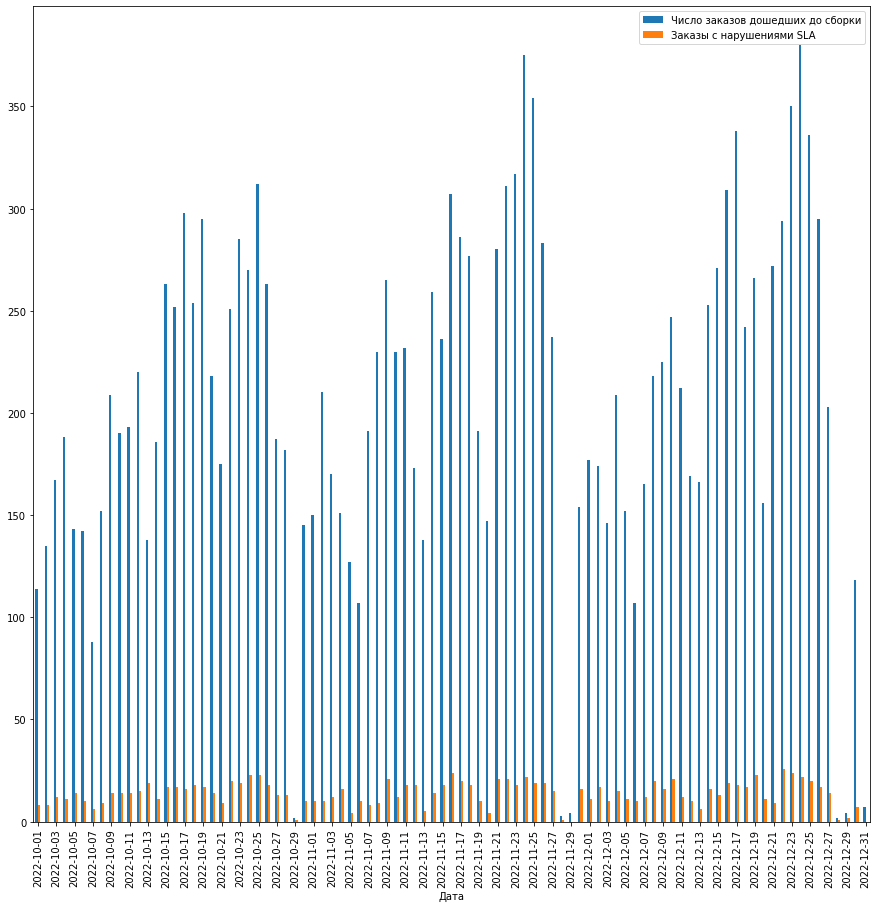

In [48]:

# Let's try merge and plot:

ax = df_all_build.merge(df_err_sla, on='Дата', how='outer').plot.bar(x='Дата', figsize=(15,15))
# other format with `ax`
ax.xaxis.set_major_locator(mdates.DayLocator(interval=2))
ax.legend(['Число заказов дошедших до сборки', 'Заказы с нарушениями SLA'])
ax.xaxis_date()

#  Проблема зацикленностей

Выведем данные о моментах, когда происходят зацикленности

In [26]:
cycle_pact_df = pd.DataFrame() # Зацикленность упаковки товара
order_come_after_build_df = pd.DataFrame() # Зацикленность на этапе сборки и поступления заказа

for val in case_df_dict.values():
    for i in range(1, len(val)):
        if val['stage'][i] == 'Упаковка товара' and val['stage'][i-1] == 'Упаковка товара':
            cycle_pact_df = cycle_pact_df.append(val.iloc[i], ignore_index=True)
        if val['stage'][i] == 'Поступление заказа сборщику' and val['stage'][i-1] == 'Сборка заказа':
            order_come_after_build_df = order_come_after_build_df.append(val.iloc[i], ignore_index=True)

/tmp/ipykernel_25290/620967890.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cycle_pact_df = cycle_pact_df.append(val.iloc[i], ignore_index=True)
/tmp/ipykernel_25290/620967890.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  order_come_after_build_df = order_come_after_build_df.append(val.iloc[i], ignore_index=True)


In [49]:
all_pact_df = pd.DataFrame()
all_build_df = pd.DataFrame()

for val in case_df_dict.values():
    for i in range(1, len(val)):
        if val['stage'][i] == 'Упаковка товара':
            all_pact_df = all_pact_df.append(val.iloc[i], ignore_index=True)
            break

/tmp/ipykernel_25290/4263485276.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_pact_df = all_pact_df.append(val.iloc[i], ignore_index=True)


In [50]:
for val in case_df_dict.values():
    for i in range(1, len(val)):
        if val['stage'][i] == 'Сборка заказа':
            all_build_df = all_build_df.append(val.iloc[i], ignore_index=True)
            break

/tmp/ipykernel_25290/239059566.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_build_df = all_build_df.append(val.iloc[i], ignore_index=True)


In [52]:
all_build_df

,case,stage,start_time,end_time,client,staff,feedback,status,duration
0,77654086061,Сборка заказа,2022-10-05 17:58:47,2022-10-05 18:22:29,Ефим Елисеевич Кошелев,Варлаам Матвеевич Орехов,,,23.700000
1,40211944184,Сборка заказа,2022-10-10 17:00:23,2022-10-10 17:24:11,Фаина Павловна Максимова,Фока Юлианович Трофимов,,,23.800000
2,80694742513,Сборка заказа,2022-10-17 21:46:56,2022-10-17 22:10:28,Якушев Ипат Ефремович,Фока Юлианович Трофимов,,,23.533333
3,77917019597,Сборка заказа,2022-12-11 13:11:58,2022-12-11 13:35:47,Бахтыбаев Тохтахун,Демид Анисимович Суворов,,,23.816667
4,36725590268,Сборка заказа,2022-10-24 20:37:26,2022-10-24 21:01:12,Якушев Мефодий Федосьевич,Ольга Юльевна Филатова,,,23.766667
...,...,...,...,...,...,...,...,...,...
19776,71024475446,Сборка заказа,2022-12-09 18:34:41,2022-12-09 18:58:19,Алена Вадимовна Евсеева,Ильина Майя Станиславовна,,,23.633333
19777,75429342160,Сборка заказа,2022-12-08 12:32:02,2022-12-08 12:55:52,Алена Вадимовна Евсеева,Быкова Анжелика Анатольевна,,,23.833333
19778,78244918485,Сборка заказа,2022-12-06 22:53:20,2022-12-06 23:17:02,Алена Вадимовна Евсеева,Быкова Анжелика Анатольевна,,,23.700000
19779,80583587050,Сборка заказа,2022-12-03 11:29:47,2022-12-03 11:53:34,Елена Александровна Ковалева,Красильникова Нонна Макаровна,,,23.783333


In [28]:
order_come_after_build_df

,case,stage,start_time,end_time,client,staff,feedback,status,duration
0,53730235079,Поступление заказа сборщику,2022-12-17 20:40:27,2022-12-17 20:41:51,Харитонов Сильвестр Марсович,Фомин Мир Трифонович,,,1.400000
1,83601182045,Поступление заказа сборщику,2022-12-04 08:25:22,2022-12-04 08:26:09,Наумов Анатолий Анисимович,Миронов Эрнст Давидович,,,0.783333
2,72696271882,Поступление заказа сборщику,2022-12-21 19:15:30,2022-12-21 19:16:52,Наумов Анатолий Анисимович,Зыков Аполлинарий Валерьевич,,,1.366667
3,32535040178,Поступление заказа сборщику,2022-11-07 18:26:14,2022-11-07 18:27:28,Жуков Валерий Михайлович,Матвеева Алла Леонидовна,,,1.233333
4,17557530724,Поступление заказа сборщику,2022-11-01 15:53:03,2022-11-01 15:54:31,Ия Андреевна Красильникова,Варлаам Матвеевич Орехов,,,1.466667
...,...,...,...,...,...,...,...,...,...
1155,34606232622,Поступление заказа сборщику,2022-10-24 10:56:23,2022-10-24 10:57:48,Станислав Захарьевич Соловьев,Владислав Ильич Тихонов,,,1.416667
1156,79208839647,Поступление заказа сборщику,2022-10-31 22:01:01,2022-10-31 22:01:47,Якушев Ипат Ефремович,Игнатова Марфа Архиповна,,,0.766667
1157,20684924915,Поступление заказа сборщику,2022-11-19 16:55:15,2022-11-19 17:28:36,Дараблы Рза,Варфоломей Тимурович Большаков,,,33.350000
1158,48917151565,Поступление заказа сборщику,2022-11-04 11:20:47,2022-11-04 11:21:56,Фаина Николаевна Третьякова,г-н Трофимов Герман Устинович,,,1.150000


In [32]:
cycle_pact_staff_dict = {}

for name in cycle_pact_df['staff']:
    if name in cycle_pact_staff_dict.keys():
        cycle_pact_staff_dict[name] = cycle_pact_staff_dict[name] + 1
    else:
        cycle_pact_staff_dict[name] = 1

In [54]:
all_pact_staff_dict = {}

for name in all_pact_df['staff']:
    if name in all_pact_staff_dict.keys():
        all_pact_staff_dict[name] = all_pact_staff_dict[name] + 1
    else:
        all_pact_staff_dict[name] = 1

In [55]:
all_build_staff_dict = {}

for name in all_build_df['staff']:
    if name in all_build_staff_dict.keys():
        all_build_staff_dict[name] = all_build_staff_dict[name] + 1
    else:
        all_build_staff_dict[name] = 1

In [37]:
come_after_build_staff_dict = {}

for name in order_come_after_build_df['staff']:
    if name in come_after_build_staff_dict.keys():
        come_after_build_staff_dict[name] = come_after_build_staff_dict[name] + 1
    else:
        come_after_build_staff_dict[name] = 1

In [58]:
len(all_pact_staff_dict), len(cycle_pact_staff_dict)

(68, 68)

In [60]:
len(all_build_staff_dict), len(come_after_build_staff_dict)

(68, 68)

In [73]:
all_build_staff_dict

{'Варлаам Матвеевич Орехов': 381,
 'Фока Юлианович Трофимов': 384,
 'Демид Анисимович Суворов': 208,
 'Ольга Юльевна Филатова': 380,
 'Моисеев Ипполит Исидорович': 382,
 'Нинель Антоновна Кудряшова': 383,
 'Брагина Елена Кузьминична': 383,
 'Наина Ефимовна Щукина': 210,
 'Филиппов Никанор Федосеевич': 211,
 'Варфоломей Тимурович Большаков': 301,
 'Блохина Евгения Борисовна': 300,
 'Оксана Архиповна Одинцова': 384,
 'Викентий Игнатович Брагин': 511,
 'Абсалямов Мифтах Шагеевич': 385,
 'Ильина Майя Станиславовна': 212,
 'Эмилия Константиновна Суворова': 382,
 'Ермил Зиновьевич Давыдов': 379,
 'Карпов Август Яковлевич': 301,
 'Ульяна Аркадьевна Овчинникова': 303,
 'Пахомов Святополк Феоктистович': 297,
 'Буров Руслан Матвеевич': 303,
 'Лаврентьев Остромир Витальевич': 302,
 'г-н Трофимов Герман Устинович': 302,
 'Молчанов Исай Игоревич': 210,
 'Павел Феофанович Уваров': 210,
 'Макаров Измаил Брониславович': 386,
 'Горбачева Екатерина Натановна': 386,
 'Васильева Олимпиада Робертовна': 211

In [42]:
cycle_pact_staff_df = pd.DataFrame({'staff': cycle_pact_staff_dict.keys(), 'Количество зацикленностей': cycle_pact_staff_dict.values()})
come_after_build_staff_df = pd.DataFrame({'staff': come_after_build_staff_dict.keys(), 'Количество зацикленностей': come_after_build_staff_dict.values()})

# cycle_pact_df = cycle_pact_df.sort_values(by='Количество зацикленностей')

In [47]:
cycle_pact_staff_df = cycle_pact_staff_df.sort_values(by='Количество зацикленностей')
come_after_build_staff_df = come_after_build_staff_df.sort_values(by='Количество зацикленностей')

In [65]:
percent_pact_arr = np.array([])

for i in range(len(cycle_pact_staff_df)):
    if cycle_pact_staff_df['staff'][i] in all_pact_staff_dict.keys():
        percent_pact_arr = np.append(percent_pact_arr, [cycle_pact_staff_df['Количество зацикленностей'][i]/all_pact_staff_dict[cycle_pact_df['staff'][i]]])

In [66]:
cycle_pact_staff_df['Процент зацикленностей'] = percent_pact_arr

In [67]:
cycle_pact_staff_df

,staff,Количество зацикленностей,Процент зацикленностей
29,Кулагин Валерий Фомич,6,0.047325
58,Уварова Пелагея Игоревна,8,0.055749
11,Вера Егоровна Наумова,8,0.059441
62,Фомин Мир Трифонович,8,0.060914
39,Молчанов Исай Игоревич,9,0.048443
...,...,...,...
44,Олимпиада Юльевна Петрова,28,0.054645
31,Леон Александрович Наумов,28,0.055749
33,Любосмысл Федотович Красильников,30,0.080420
14,Воронцова Майя Александровна,31,0.064846


In [68]:
percent_build_arr = np.array([])

for i in range(len(come_after_build_staff_df)):
    if come_after_build_staff_df['staff'][i] in all_build_staff_dict.keys():
        percent_build_arr = np.append(percent_build_arr, [come_after_build_staff_df['Количество зацикленностей'][i]/all_build_staff_dict[come_after_build_staff_df['staff'][i]]])

In [69]:
come_after_build_staff_df['Процент зацикленностей'] = percent_build_arr

In [70]:
come_after_build_staff_df

,staff,Количество зацикленностей,Процент зацикленностей
29,Кулагин Валерий Фомич,6,0.070130
55,Соколов Василий Захарьевич,10,0.066667
57,Титов Вячеслав Анатольевич,11,0.053333
62,Фомин Мир Трифонович,11,0.071770
60,Филиппов Никанор Федосеевич,11,0.070000
...,...,...,...
24,Игнатова Марфа Архиповна,26,0.056478
43,Оксана Архиповна Одинцова,27,0.046512
0,Абсалямов Мифтах Шагеевич,27,0.075916
34,Макаров Измаил Брониславович,28,0.073826


In [71]:
come_after_build_staff_df = come_after_build_staff_df.sort_values(by='Процент зацикленностей')
cycle_pact_staff_df = cycle_pact_staff_df.sort_values(by='Процент зацикленностей')

In [72]:
cycle_pact_staff_df.to_excel('tables/зацикленности_упаковка_товара.xlsx')
come_after_build_staff_df.to_excel('tables/зацикленности_поступление_заказа_после_сборки.xlsx')

# Большие промежутки между операциями

Сделаем вот такую таблицу

![image 10390.png](<attachment:image 10390.png>)
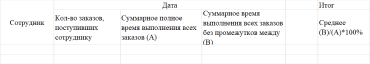

In [93]:
staff_df_dict = {} # staff_name: df with all his actions

for series in res_df.iloc:
    if type(series['staff']) != float:
        if series['staff'] in staff_df_dict.keys():
            staff_df_dict[series['staff']] = staff_df_dict[series['staff']].append(series, ignore_index = True)
        else:
            staff_df_dict[series['staff']] = pd.DataFrame()
            staff_df_dict[series['staff']] = staff_df_dict[series['staff']].append(series, ignore_index = True)

/tmp/ipykernel_25290/1843260345.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  staff_df_dict[series['staff']] = staff_df_dict[series['staff']].append(series, ignore_index = True)
/tmp/ipykernel_25290/1843260345.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  staff_df_dict[series['staff']] = staff_df_dict[series['staff']].append(series, ignore_index = True)
/tmp/ipykernel_25290/1843260345.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  staff_df_dict[series['staff']] = staff_df_dict[series['staff']].append(series, ignore_index = True)
/tmp/ipykernel_25290/1843260345.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  staff_df

In [95]:
len(staff_df_dict)

206

In [96]:
for key in staff_df_dict.keys(): # sort dfs in dict by start_time
    staff_df_dict[key] = staff_df_dict[key].sort_values(by='start_time')

In [97]:
staff_df_dict

{'Варлаам Матвеевич Орехов':              case                        stage          start_time  \
 1376  78591858581  Поступление заказа сборщику 2022-10-01 08:01:25   
 1377  78591858581                Сборка заказа 2022-10-01 08:02:41   
 1378  78591858581               Звонок клиенту 2022-10-01 08:26:30   
 61    73144017105  Поступление заказа сборщику 2022-10-01 10:32:51   
 62    73144017105                Сборка заказа 2022-10-01 10:33:50   
 ...           ...                          ...                 ...   
 1029  67257869107                       Оплата 2022-11-02 16:58:13   
 478   23152121901  Поступление заказа сборщику 2022-11-02 17:31:58   
 479   23152121901                Сборка заказа 2022-11-02 17:33:04   
 480   23152121901              Упаковка товара 2022-11-02 17:57:01   
 481   23152121901                       Оплата 2022-11-02 17:59:10   
 
                 end_time                         client  \
 1376 2022-10-01 08:02:41     Бакштаев Леонид Георгиевич  

In [148]:
import datetime as dt
from datetime import date

staff_dict_time_work = {} # name: time_work
staff_dict_time_chill = {} # name: time_chill

for key, val in staff_df_dict.items():
    if key == 'Аширов Какаджан':
        start_time = val.iloc[0]['start_time']
        end_time = val.iloc[0]['end_time']
        staff_dict_time_chill[key] = 0
        staff_dict_time_work[key] = 0
        for i in range(1, len(val)):
            print(val.iloc[i]['start_time'], val.iloc[i]['end_time'])
            new_start_time = val.iloc[i]['start_time']
            if (new_start_time - end_time).total_seconds() <= 0:
                if val.iloc[i]['end_time'] > end_time:
                    end_time = val.iloc[i]['end_time']
            else:
                if (new_start_time.hour > 8 and end_time.hour < 8):
                    time_fin = dt.time(0,0,0)
                    time_sta = dt.time(8,0,0)
                    add = (datetime.combine(date.min, new_start_time.time()) - datetime.combine(date.min, time_sta)).total_seconds() + (datetime.combine(date.min, end_time.time()) - datetime.combine(date.min, time_fin)).total_seconds()
                    print('new_start_time.hour > 8 and end_time.hour < 8')
                    print(f'new_start_time: {new_start_time}, end_time: {end_time}')
                    print(f'add: {add / 60}')
                    staff_dict_time_chill[key] = staff_dict_time_chill[key] + add / 60
                elif (new_start_time.date() != end_time.date()):
                    time_fin = dt.time(23,59,59)
                    time_sta = dt.time(8,0,0)
                    add = (datetime.combine(date.min, new_start_time.time()) - datetime.combine(date.min, time_sta)).total_seconds() + (datetime.combine(date.min, time_fin) - datetime.combine(date.min, end_time.time())).total_seconds()
                    print('new_start_time.date() != end_time.date()')
                    print(f'new_start_time: {new_start_time}, end_time: {end_time}')
                    print(f'add: {add/60}')
                    staff_dict_time_chill[key] = staff_dict_time_chill[key] + add/60
                else:
                    add =  (new_start_time - end_time).total_seconds() / 60
                    print('else')
                    print(f'new_start_time: {new_start_time}, end_time: {end_time}')
                    print(f'add: {add}')
                    staff_dict_time_chill[key] = staff_dict_time_chill[key] + add
                add_work = (end_time - start_time).total_seconds() / 60
                print('work')
                print(f'start_time: {start_time}, end_time: {end_time}')
                print(f'add_work: {add_work}')
                staff_dict_time_work[key]  = staff_dict_time_work[key] + add_work

                start_time = val.iloc[i]['start_time']
                end_time   = val.iloc[i]['end_time']

2022-12-08 18:33:13 2022-12-08 19:06:06
2022-12-08 19:06:06 2022-12-08 19:07:41
2022-12-08 19:07:41 2022-12-08 19:07:46
2022-12-08 20:58:13 2022-12-08 21:02:28
else
new_start_time: 2022-12-08 20:58:13, end_time: 2022-12-08 19:07:46
add: 110.45
work
start_time: 2022-12-08 17:54:17, end_time: 2022-12-08 19:07:46
add_work: 73.48333333333333
2022-12-08 21:02:28 2022-12-08 21:35:03
2022-12-08 21:35:03 2022-12-08 21:36:49
2022-12-08 23:40:25 2022-12-08 23:44:37
else
new_start_time: 2022-12-08 23:40:25, end_time: 2022-12-08 21:36:49
add: 123.6
work
start_time: 2022-12-08 20:58:13, end_time: 2022-12-08 21:36:49
add_work: 38.6
2022-12-08 23:44:37 2022-12-09 00:17:10
2022-12-09 00:17:10 2022-12-09 00:18:54
2022-12-09 00:18:54 2022-12-09 00:19:00
2022-12-09 11:54:29 2022-12-09 11:58:39
new_start_time.hour > 8 and end_time.hour < 8
new_start_time: 2022-12-09 11:54:29, end_time: 2022-12-09 00:19:00
add: -1186.5
work
start_time: 2022-12-08 23:40:25, end_time: 2022-12-09 00:19:00
add_work: 38.5833333

In [133]:
staff_dict_time_chill

{'Варлаам Матвеевич Орехов': 13873.116666666669,
 'Фока Юлианович Трофимов': 11648.06666666667,
 'Демид Анисимович Суворов': 11821.716666666667,
 'Аркадин Иван Иванович': 3780.1833333333316,
 'Ольга Юльевна Филатова': 14784.416666666662,
 'Абрамян Хорен Бабкенович': 7255.516666666661,
 'Моисеев Ипполит Исидорович': 14819.58333333333,
 'Аврамов Иван Иванович': 2034.6999999999982,
 'Нинель Антоновна Кудряшова': 17740.250000000004,
 'Адашев Раджаб Халимович': 4565.083333333334,
 'Брагина Елена Кузьминична': 12781.766666666674,
 'Наина Ефимовна Щукина': 9322.133333333326,
 'Байжанбаев Жанат Ануарбекович': 1195.716666666664,
 'Филиппов Никанор Федосеевич': 15187.66666666666,
 'Бакиров Филарит Абдулгазимович': -2839.7666666666664,
 'Варфоломей Тимурович Большаков': 19094.75,
 'Анкудинов Андрей Робертович': 10029.933333333329,
 'Блохина Евгения Борисовна': 21483.99999999998,
 'Алексеев Николай Валентинович': 10522.400000000003,
 'Оксана Архиповна Одинцова': 13232.883333333337,
 'Абдульманов Р

In [134]:
staff_dict_time_work

{'Варлаам Матвеевич Орехов': 11958.550000000003,
 'Фока Юлианович Трофимов': 12123.75,
 'Демид Анисимович Суворов': 6653.699999999999,
 'Аркадин Иван Иванович': 3927.350000000001,
 'Ольга Юльевна Филатова': 11696.266666666648,
 'Абрамян Хорен Бабкенович': 5688.933333333331,
 'Моисеев Ипполит Исидорович': 11653.050000000005,
 'Аврамов Иван Иванович': 6232.766666666667,
 'Нинель Антоновна Кудряшова': 12039.08333333332,
 'Адашев Раджаб Халимович': 5974.53333333333,
 'Брагина Елена Кузьминична': 11831.999999999993,
 'Наина Ефимовна Щукина': 6951.7166666666635,
 'Байжанбаев Жанат Ануарбекович': 3882.7666666666646,
 'Филиппов Никанор Федосеевич': 6579.066666666664,
 'Бакиров Филарит Абдулгазимович': 3877.8833333333328,
 'Варфоломей Тимурович Большаков': 9643.216666666664,
 'Анкудинов Андрей Робертович': 6024.116666666667,
 'Блохина Евгения Борисовна': 9667.716666666674,
 'Алексеев Николай Валентинович': 6345.666666666667,
 'Оксана Архиповна Одинцова': 11899.933333333334,
 'Абдульманов Рим Са

In [142]:
staff_work_time = pd.DataFrame()
staff_work_time['staff'] = staff_dict_time_chill.keys()
staff_work_time['Время работы в минутах'] = staff_dict_time_work.values()
staff_work_time['Время отдыха в минутах'] = staff_dict_time_chill.values()

In [145]:
staff_work_time.to_excel('tables/отдых_и_работа_сотрудников.xlsx')

In [147]:
staff_df_dict['Аширов Какаджан'].to_excel('tables/test.xlsx')